#  Bank Case Study
Author: Evan Condalary

## Goals:
1. Investigate sample data set with descriptive stats / visualizations
2. Find most explanatory features for y to build intuition
3. Use simple imputation for missing categorical values
4. Evaluate several appropriate ML model candidates on sample
5. Hyper-parameter tuning for top model candidates from above
6. Evaluate performance of best model on sample
7. Identify best cutoff probabilty for positive prediction
8. Explore most explanatory features from final model


## Model Metrics:
- Recall = the ability of the classifier to find all the positive samples
    - critical metric
    - it's relatively cheap to reach out via telemarketing and the reward is high, so we don't want to miss any potential positives
    - data set is imbalanced toward negatives (only ~11% will accept term deposit)
- Accuracy = how often the classifier gets the answer correct
    - next most critical metric
    - don't want to spend too much time making bad calls either, so need to balance with recall
- ROC Area Under Curve = the probability that a classifier will rank a randomly chosen positive instance higher than a randomly chosen negative one
    - describes confidence that the algorithm can perform in general (regardless of threshold)
    - good for figuring out best candidates to tune

## Given more time/resources:
1. Explore more complex imputation methods for categorical variables
2. Do more thorough outlier analysis / pruning based on example characteristics
3. Evaluate model performance by various features of interest (ex. age bands or other demographic features)
4. Identify better scaling methods for each numeric variable
5. Create larger hyper-parameter tuning space for candidate models (and tune more candidates)


In [1]:
import pandas as pd
import numpy as np
import logging
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.impute import SimpleImputer

import warnings
warnings.filterwarnings("ignore")

# set up logging
logging.basicConfig(format="%(asctime)s - %(name)s - %(levelname)s - %(message)s")
LOGGER = logging.getLogger(__name__)
LOGGER.setLevel(logging.INFO)

# set up plotting
%matplotlib inline
plt.rcParams['figure.figsize'] = [20, 10]


# read sample data in
sample = pd.read_csv("bank-additional/bank-additional.csv", delimiter=";")

# remove duration from analysis set (benchmark var only bc it is not known prior to call)
sample.pop("duration")

# get var types
CAT_VARS = sample.drop("y", axis=1).select_dtypes(["object"]).columns
NUM_VARS = sample.select_dtypes(["int64", "float64"]).columns


# establish functions
def preprocess_data(df, categorical_cols, numeric_cols):

    # recode y as 0 or 1
    df["y"] = (df["y"] == "yes").astype("int")
    
    # recode pdays so 999 = -1
    df["pdays"] = df["pdays"].replace(999, -1)
    
    # impute unknown categoricals
    imp = SimpleImputer(missing_values="unknown", strategy='most_frequent')
    df[categorical_cols] = imp.fit_transform(df[categorical_cols])
    
    # recode cat vars using data dict
    for var in categorical_cols:
        dummy = pd.get_dummies(df[var], prefix=var, drop_first=True)
        df = pd.concat([df, dummy], axis=1).drop(var, axis=1)

    # split into train / test sets
    train, test = train_test_split(df, test_size=0.3, random_state=1990)

    X = train.loc[:, train.columns != "y"]
    y = train["y"]

    X_test = test.loc[:, test.columns != "y"]
    y_test = test["y"]

    # rescale num vars (using train only)
    scaler = MinMaxScaler(feature_range=(0,1))
    scaler.fit(X[numeric_cols])
    X[numeric_cols] = scaler.transform(X[numeric_cols])
    X_test[numeric_cols] = scaler.transform(X_test[numeric_cols])
    
    return X, y, X_test, y_test


# run preprocessing for sample
X, y, X_test, y_test = preprocess_data(sample.copy(), categorical_cols=CAT_VARS, numeric_cols=NUM_VARS)

# get naive statistic
NAIVE_STAT = (y_test == 0).sum() / y_test.count()

In [2]:
# inspect raw data
sample.head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,30,blue-collar,married,basic.9y,no,yes,no,cellular,may,fri,2,999,0,nonexistent,-1.8,92.893,-46.2,1.313,5099.1,no
1,39,services,single,high.school,no,no,no,telephone,may,fri,4,999,0,nonexistent,1.1,93.994,-36.4,4.855,5191.0,no
2,25,services,married,high.school,no,yes,no,telephone,jun,wed,1,999,0,nonexistent,1.4,94.465,-41.8,4.962,5228.1,no
3,38,services,married,basic.9y,no,unknown,unknown,telephone,jun,fri,3,999,0,nonexistent,1.4,94.465,-41.8,4.959,5228.1,no
4,47,admin.,married,university.degree,no,yes,no,cellular,nov,mon,1,999,0,nonexistent,-0.1,93.200,-42.0,4.191,5195.8,no


In [3]:
# descriptive stats for num vars
sample.describe()

,age,campaign,pdays,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed
count,4119.000000,4119.000000,4119.000000,4119.000000,4119.000000,4119.000000,4119.000000,4119.000000,4119.000000
mean,40.113620,2.537266,960.422190,0.190337,0.084972,93.579704,-40.499102,3.621356,5166.481695
std,10.313362,2.568159,191.922786,0.541788,1.563114,0.579349,4.594578,1.733591,73.667904
min,18.000000,1.000000,0.000000,0.000000,-3.400000,92.201000,-50.800000,0.635000,4963.600000
25%,32.000000,1.000000,999.000000,0.000000,-1.800000,93.075000,-42.700000,1.334000,5099.100000
50%,38.000000,2.000000,999.000000,0.000000,1.100000,93.749000,-41.800000,4.857000,5191.000000
75%,47.000000,3.000000,999.000000,0.000000,1.400000,93.994000,-36.400000,4.961000,5228.100000
max,88.000000,35.000000,999.000000,6.000000,1.400000,94.767000,-26.900000,5.045000,5228.100000


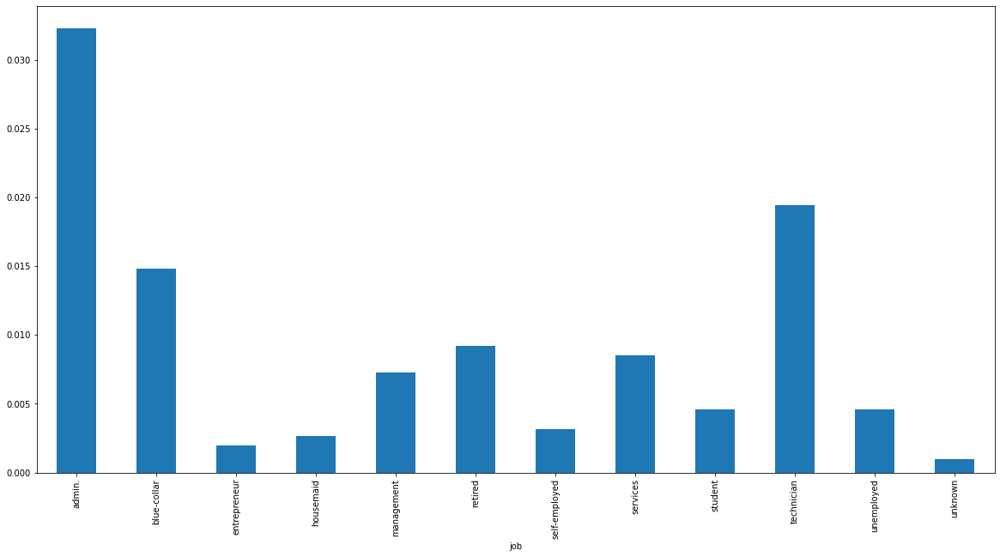

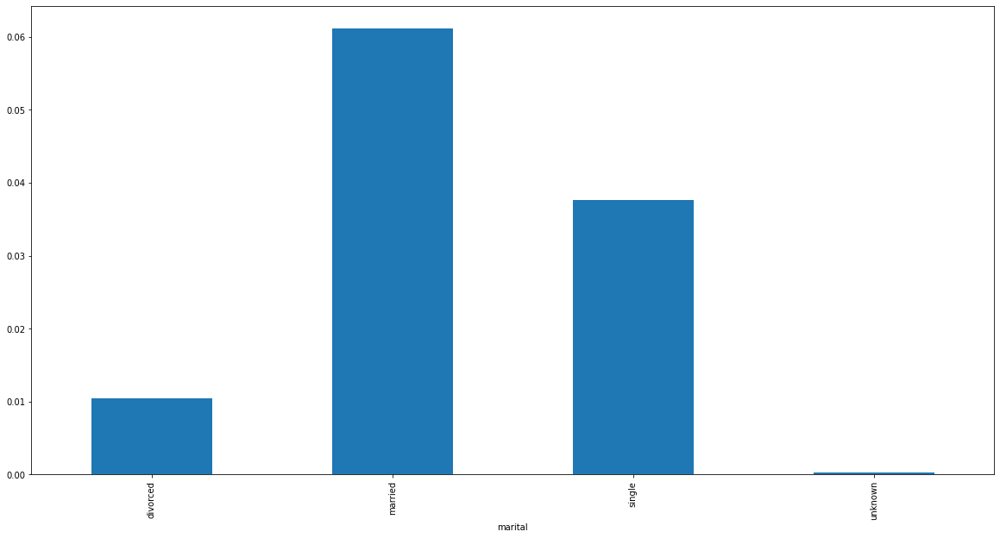

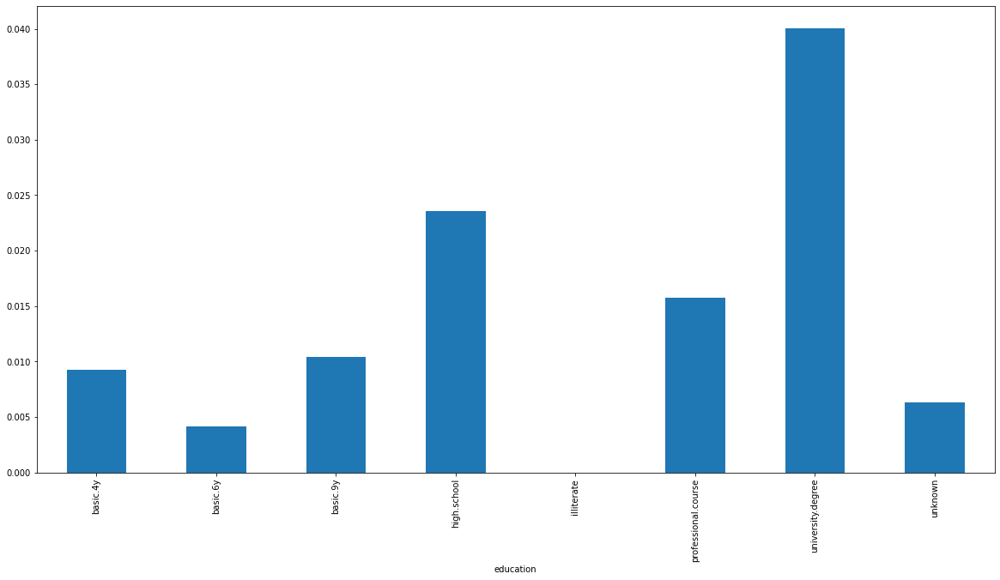

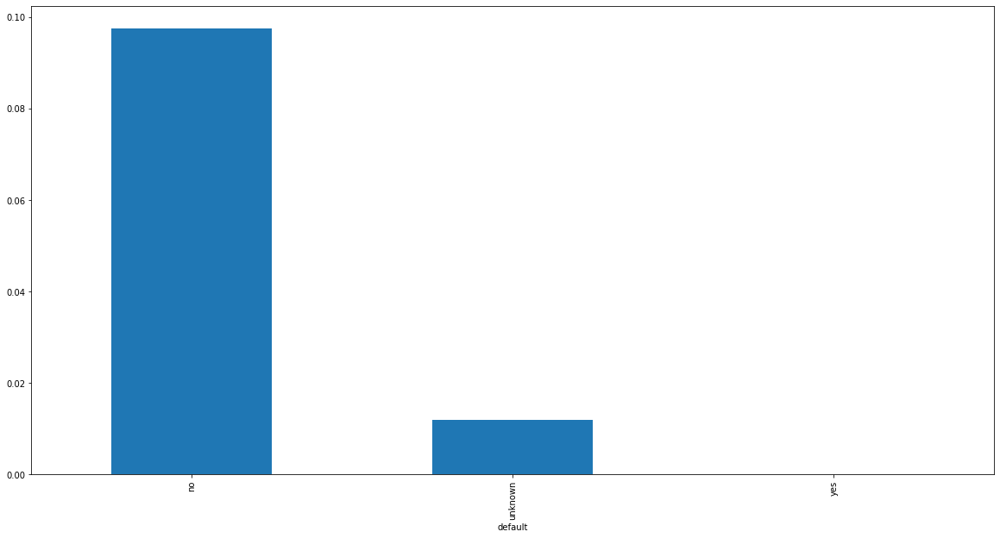

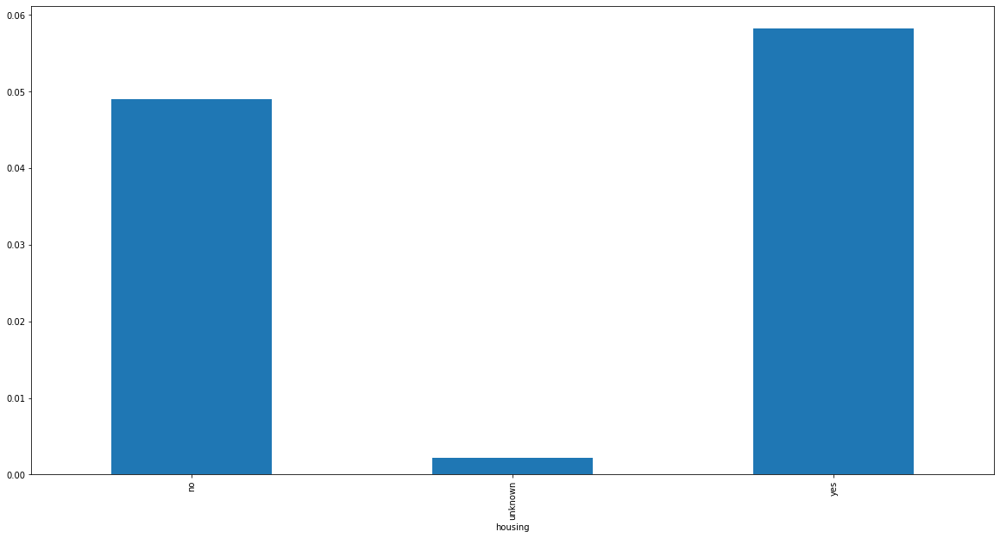

...

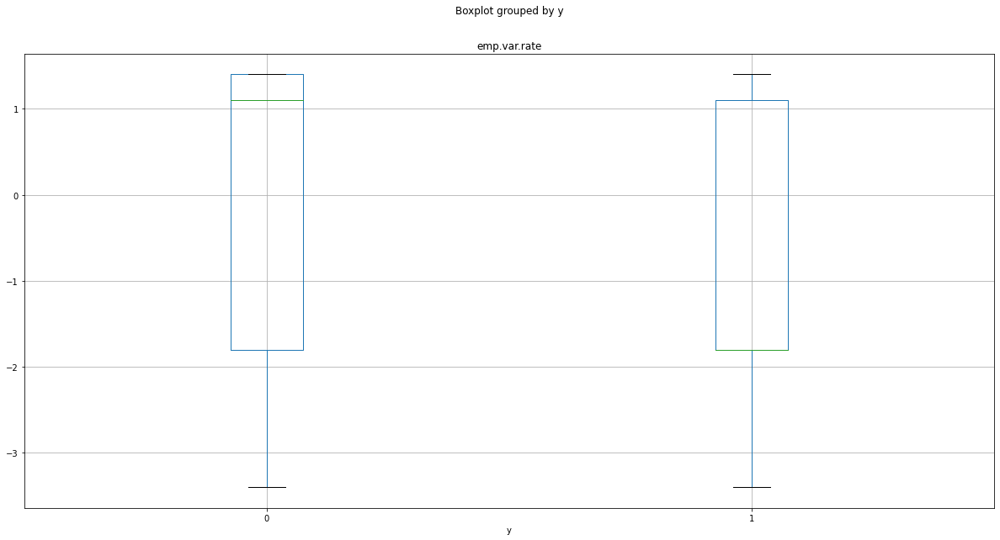

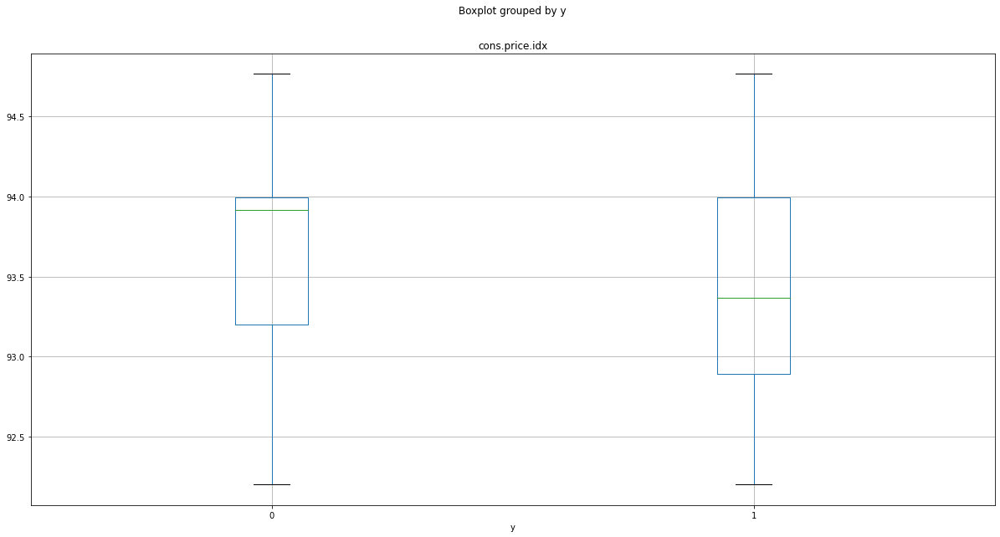

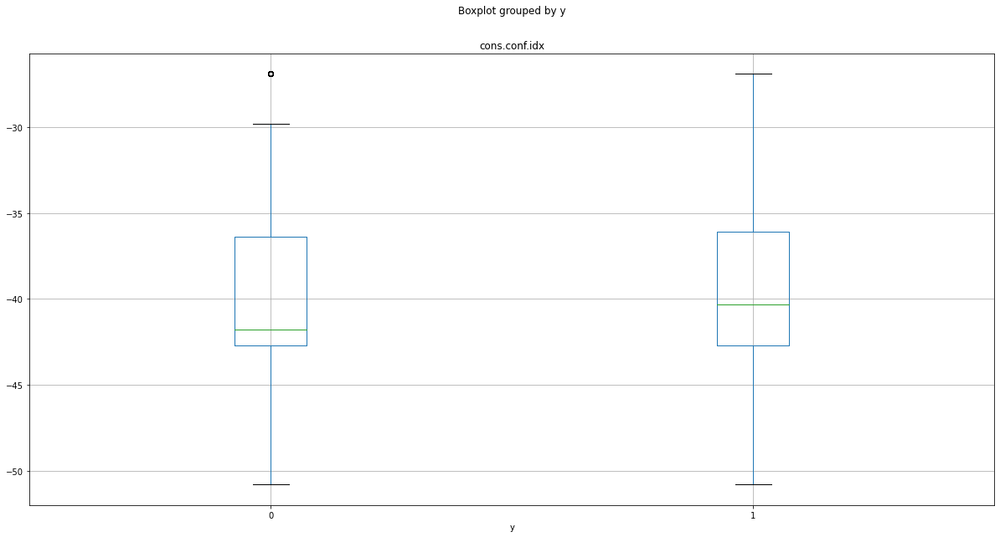

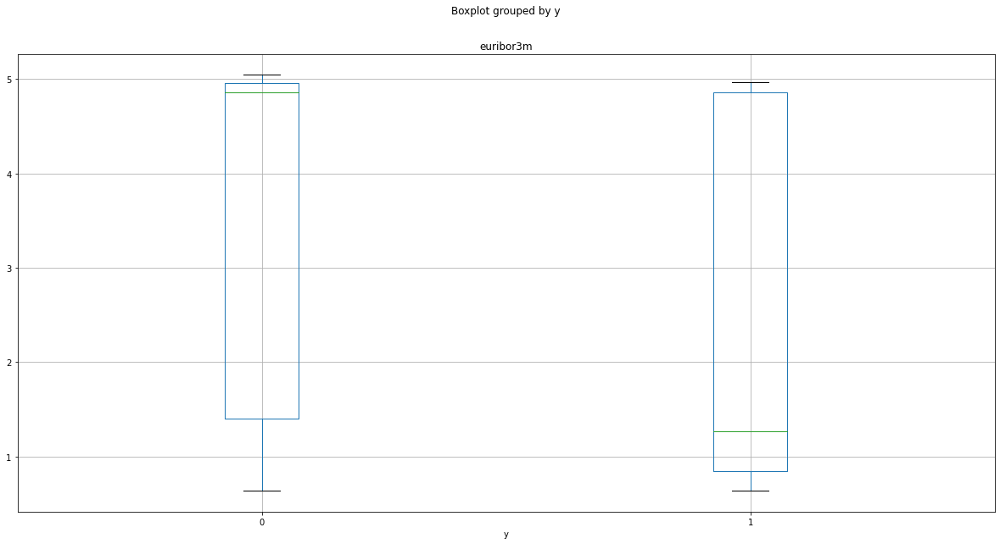

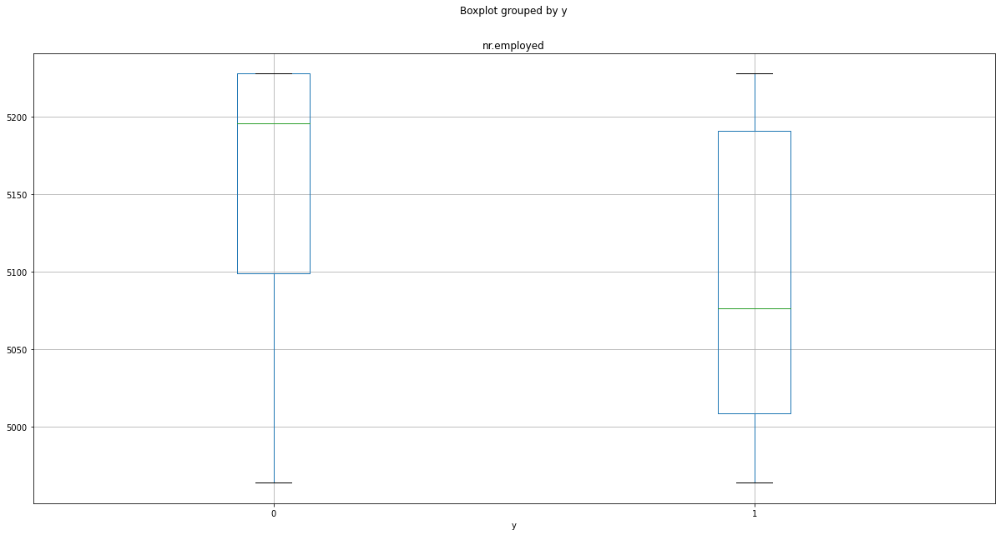

In [5]:
# visualize y vs. all vars
# categoricals
sample["y"] = (sample["y"] == "yes").astype("int")
total = sample.shape[0]
for var in CAT_VARS:
    _d = sample.groupby(var)["y"].apply(lambda i: i.sum()/total)
    _d.plot(kind="bar")
    plt.show()

# numerics
for var in NUM_VARS:
    sample.boxplot(column=var, by="y")
    plt.show()

pdays          -0.332012
previous        0.255697
emp.var.rate   -0.283216
euribor3m      -0.298565
nr.employed    -0.349241
y               1.000000
Name: y, dtype: float64


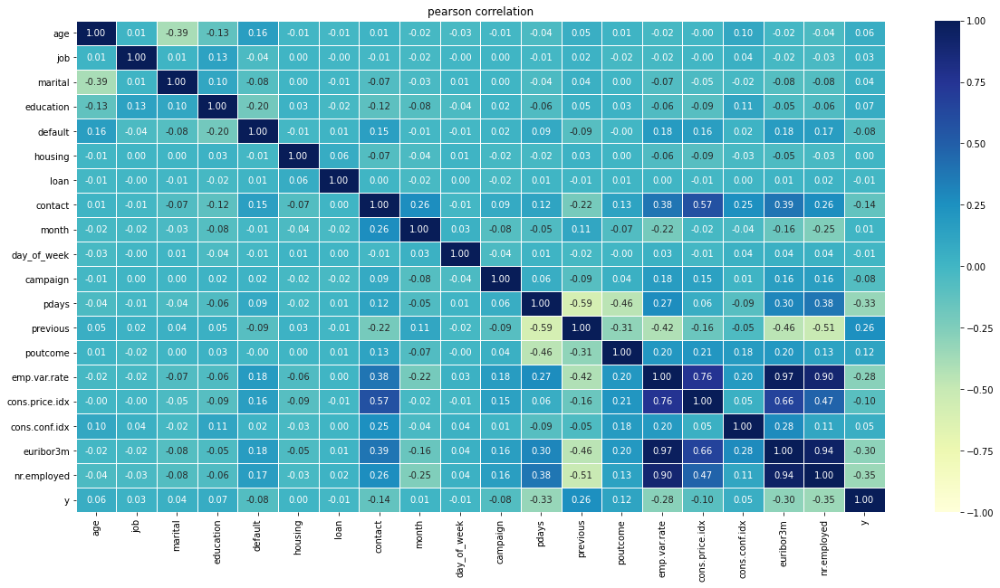

In [6]:
# correlation matrix
corr_matrix = sample.copy()
for col in corr_matrix.columns:
    if corr_matrix[col].dtype == "O":
         corr_matrix[col] = corr_matrix[col].factorize(sort=True)[0]
corr_matrix = corr_matrix.corr(method="pearson")
sns.heatmap(corr_matrix, vmin=-1., vmax=1., annot=True, fmt='.2f', cmap="YlGnBu", cbar=True, linewidths=0.5)
plt.title("pearson correlation")

# best correlations to outcome
print(corr_matrix.loc[(abs(corr_matrix["y"]) > 0.2), "y"])

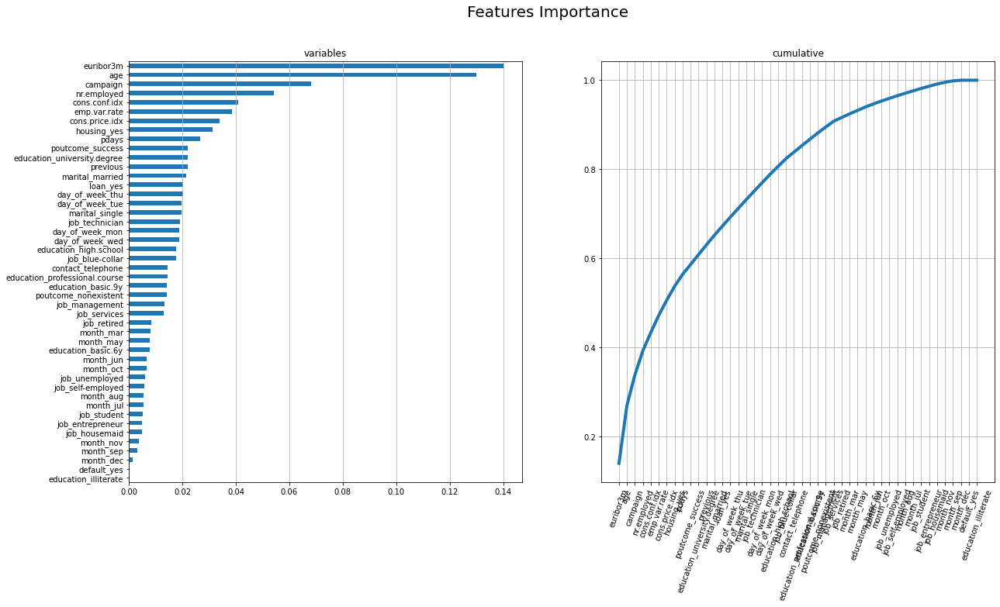

In [7]:
# feature importance assessment
from sklearn.ensemble import RandomForestClassifier

feature_names = X.columns.tolist()
model = RandomForestClassifier(n_estimators=100, criterion="entropy", random_state=0)
model.fit(X, y)
importances = model.feature_importances_

imp = pd.DataFrame(
    {
        "importance": importances, 
        "var": feature_names
    }
).sort_values("importance", ascending=False)
imp['cumsum'] =  imp['importance'].cumsum(axis=0)
imp = imp.set_index("var")
    
# build plot
fig, ax = plt.subplots(nrows=1, ncols=2, sharex=False, sharey=False)
fig.suptitle("Features Importance", fontsize=20)
ax[0].title.set_text('variables')
imp[["importance"]].sort_values(by="importance").plot(kind="barh", legend=False, ax=ax[0]).grid(axis="x")
ax[0].set(ylabel="")
ax[1].title.set_text('cumulative')
imp[["cumsum"]].plot(kind="line", linewidth=4, legend=False, ax=ax[1])
ax[1].set(xlabel="", xticks=np.arange(len(imp)), xticklabels=imp.index)
plt.xticks(rotation=70)
plt.grid(axis='both')
plt.show()

# Notes:
# First 10 vars are most useful for prediction
# However, all but the last ~6 contribute to explanability

# Most useful:
# - euribor3m = euribor 3 month rate - daily indicator (numeric)
# - age = age of consumer
# - campaign = number of contacts performed during this campaign and for this consumer (numeric, includes last contact)
# - nr.employed = number of employees - quarterly indicator (numeric)
# - cons.conf.idx = consumer confidence index - monthly indicator (numeric) 
# - emp.var.rate = employment variation rate - quarterly indicator (numeric)
# - pdays = number of days that passed by after the client was last contacted from a previous campaign (numeric; 999 means client was not previously contacted)
# - cons.price.idx = consumer price index - monthly indicator (numeric)  
# - housing_yes = consumer has a housing loan
# - poutcome_sucess = last marketing campaign was a success

In [8]:
# train/test info
print("X_train shape:", X.shape, "| X_test shape:", X_test.shape)
print("y_train mean:", round(np.mean(y),2), "| y_test mean:", round(np.mean(y_test),2))
print(X.shape[1], "features:", X.columns.to_list())

X_train shape: (2883, 46) | X_test shape: (1236, 46)
y_train mean: 0.11 | y_test mean: 0.11
46 features: ['age', 'campaign', 'pdays', 'previous', 'emp.var.rate', 'cons.price.idx', 'cons.conf.idx', 'euribor3m', 'nr.employed', 'job_blue-collar', 'job_entrepreneur', 'job_housemaid', 'job_management', 'job_retired', 'job_self-employed', 'job_services', 'job_student', 'job_technician', 'job_unemployed', 'marital_married', 'marital_single', 'education_basic.6y', 'education_basic.9y', 'education_high.school', 'education_illiterate', 'education_professional.course', 'education_university.degree', 'default_yes', 'housing_yes', 'loan_yes', 'contact_telephone', 'month_aug', 'month_dec', 'month_jul', 'month_jun', 'month_mar', 'month_may', 'month_nov', 'month_oct', 'month_sep', 'day_of_week_mon', 'day_of_week_thu', 'day_of_week_tue', 'day_of_week_wed', 'poutcome_nonexistent', 'poutcome_success']


=== Model = log_regr ===
Passes naive test? False
Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.84      0.89      1102
           1       0.31      0.59      0.41       134

    accuracy                           0.81      1236
   macro avg       0.63      0.72      0.65      1236
weighted avg       0.88      0.81      0.84      1236

Metrics:
{'cross_val_accuracy': 0.82,
 'recall': 0.59,
 'test_accuracy': 0.815,
 'train_accuracy': 0.828,
 'train_test_accuracy_diff': 0.013}


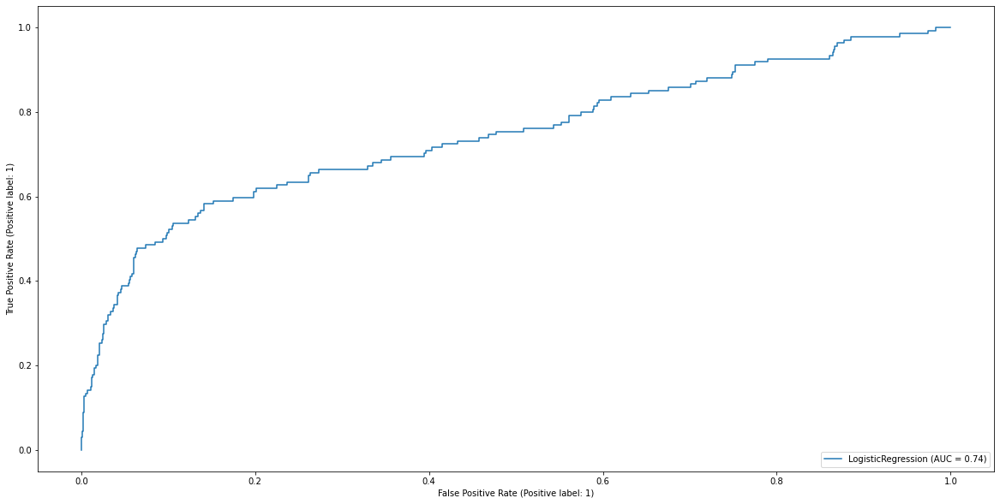

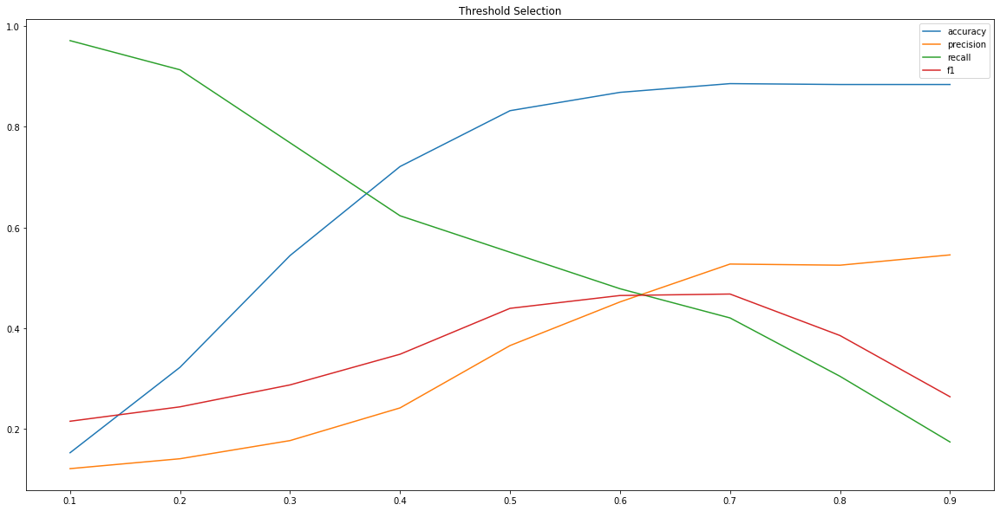

=== Model = linear_svc ===
Passes naive test? False
Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.73      0.82      1102
           1       0.23      0.69      0.35       134

    accuracy                           0.72      1236
   macro avg       0.59      0.71      0.59      1236
weighted avg       0.87      0.72      0.77      1236

Metrics:
{'cross_val_accuracy': 0.717,
 'recall': 0.687,
 'test_accuracy': 0.722,
 'train_accuracy': 0.717,
 'train_test_accuracy_diff': -0.004}


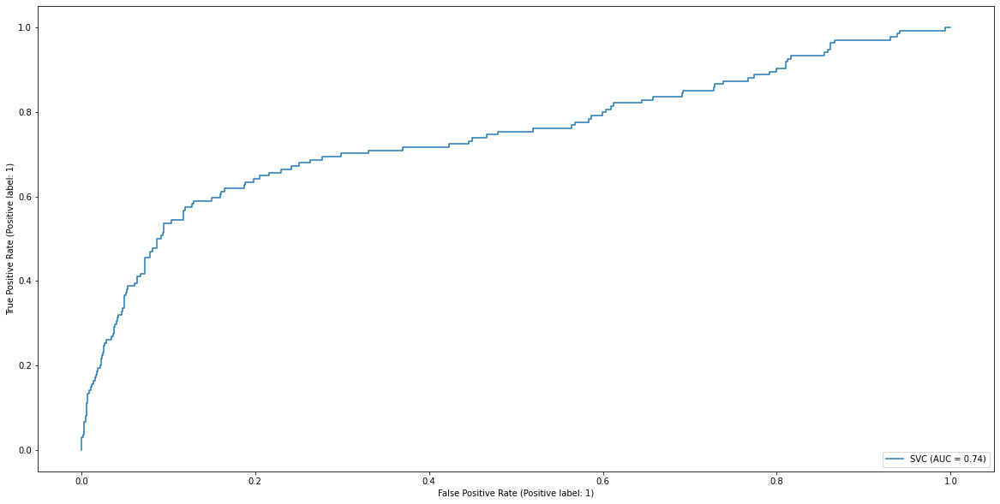

Process failed - error: predict_proba is not available when  probability=False
=== Model = rbf_svc ===
Passes naive test? False
Classification Report:
              precision    recall  f1-score   support

           0       0.89      0.96      0.92      1102
           1       0.02      0.01      0.01       134

    accuracy                           0.85      1236
   macro avg       0.45      0.48      0.47      1236
weighted avg       0.79      0.85      0.82      1236

Metrics:
{'cross_val_accuracy': 0.866,
 'recall': 0.007,
 'test_accuracy': 0.854,
 'train_accuracy': 0.97,
 'train_test_accuracy_diff': 0.116}


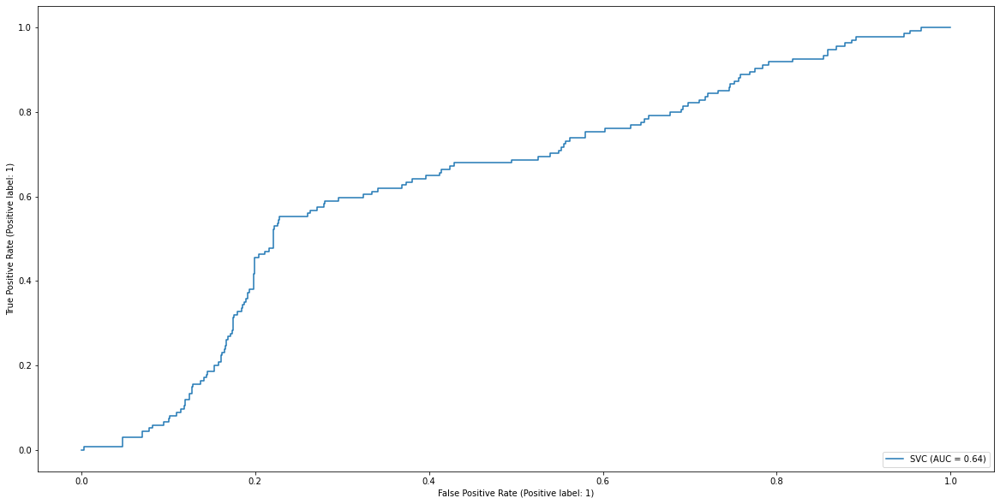

Process failed - error: predict_proba is not available when  probability=False
=== Model = decision_tree ===
Passes naive test? False
Classification Report:
              precision    recall  f1-score   support

           0       0.93      0.93      0.93      1102
           1       0.43      0.46      0.44       134

    accuracy                           0.88      1236
   macro avg       0.68      0.69      0.69      1236
weighted avg       0.88      0.88      0.88      1236

Metrics:
{'cross_val_accuracy': 0.82,
 'recall': 0.455,
 'test_accuracy': 0.876,
 'train_accuracy': 0.896,
 'train_test_accuracy_diff': 0.02}


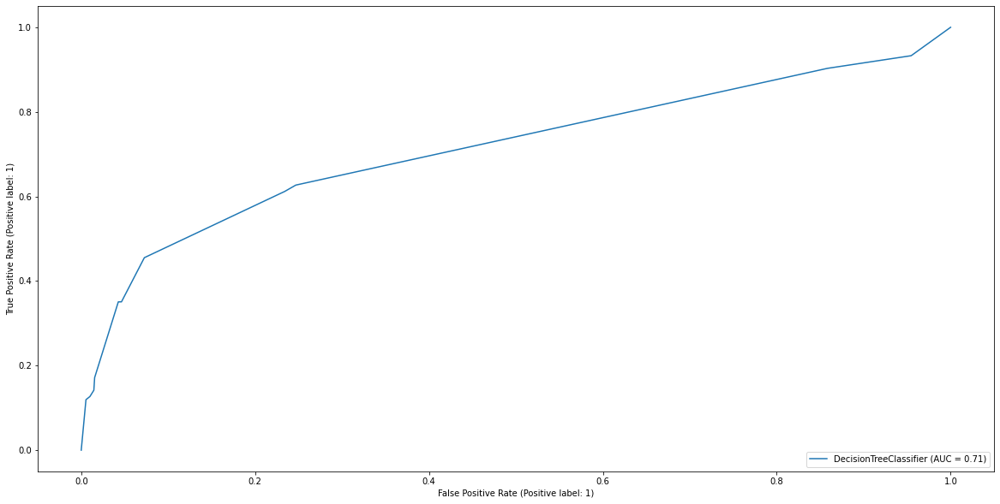

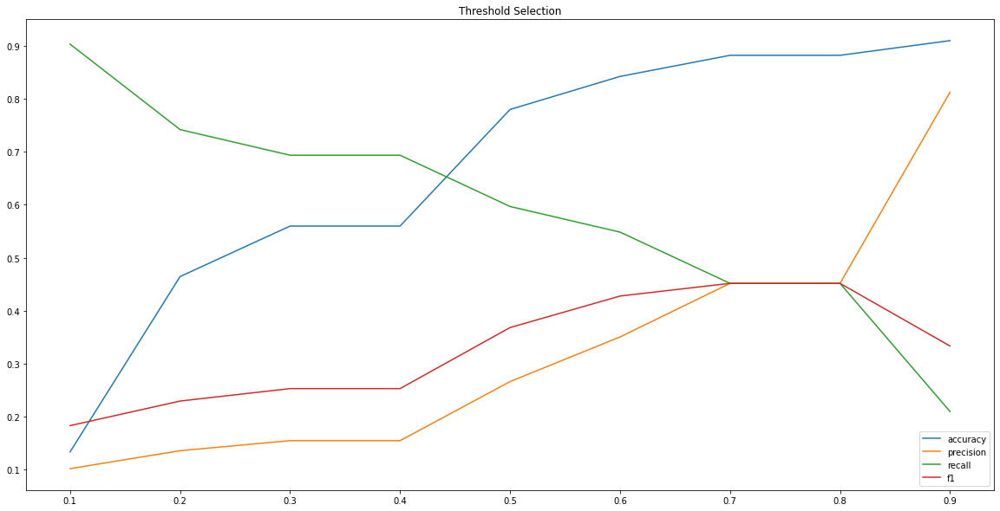

=== Model = random_forest ===
Passes naive test? False
Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.88      0.91      1102
           1       0.37      0.56      0.44       134

    accuracy                           0.85      1236
   macro avg       0.65      0.72      0.68      1236
weighted avg       0.88      0.85      0.86      1236

Metrics:
{'cross_val_accuracy': 0.86,
 'recall': 0.56,
 'test_accuracy': 0.847,
 'train_accuracy': 0.867,
 'train_test_accuracy_diff': 0.02}


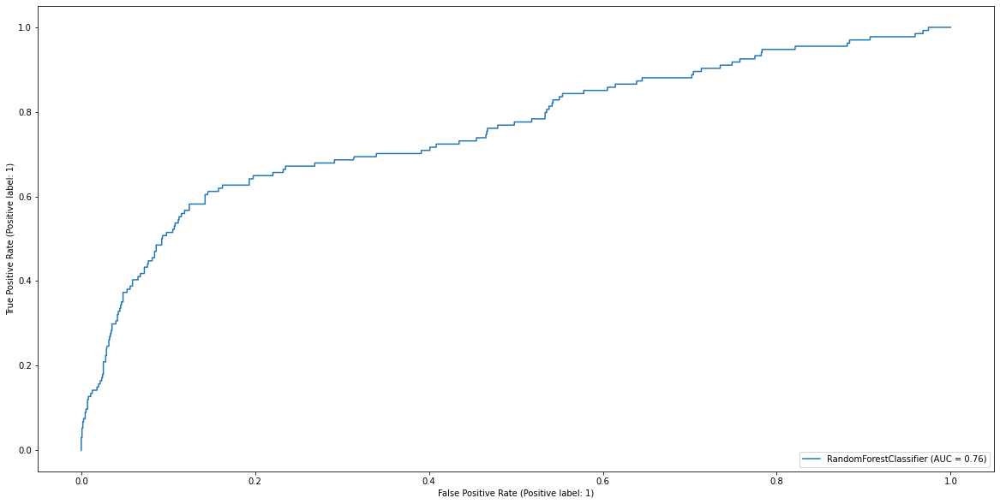

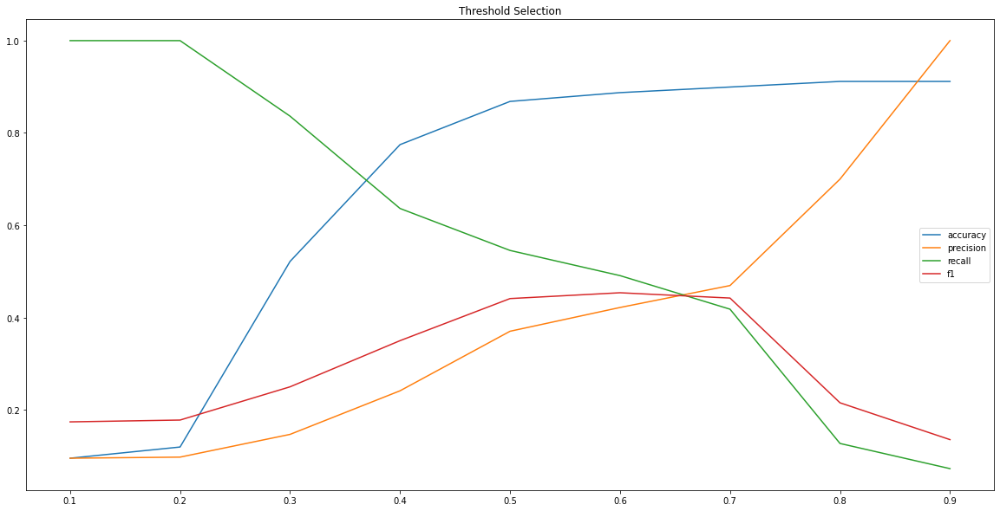

=== Model = neural_net ===
Passes naive test? True
Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.97      0.94      1102
           1       0.51      0.26      0.35       134

    accuracy                           0.89      1236
   macro avg       0.71      0.62      0.64      1236
weighted avg       0.87      0.89      0.88      1236

Metrics:
{'cross_val_accuracy': 0.891,
 'recall': 0.261,
 'test_accuracy': 0.893,
 'train_accuracy': 0.937,
 'train_test_accuracy_diff': 0.044}


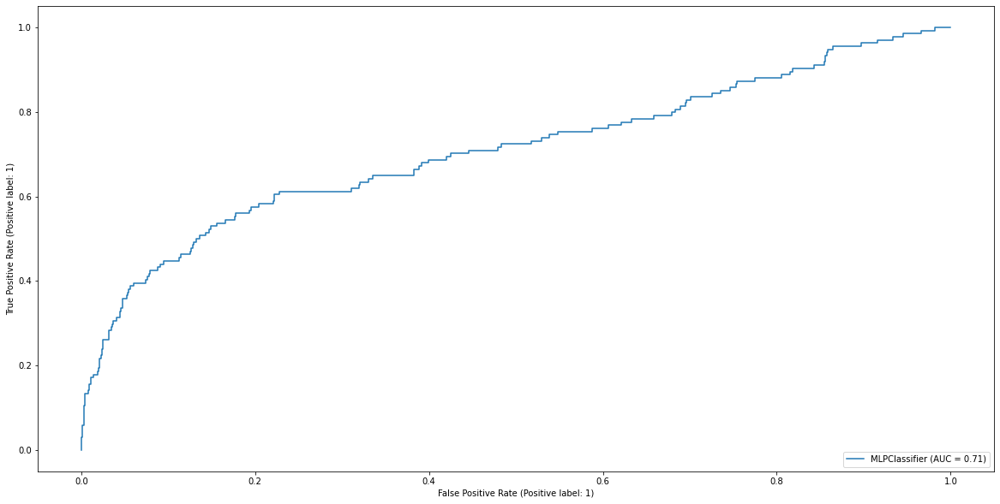

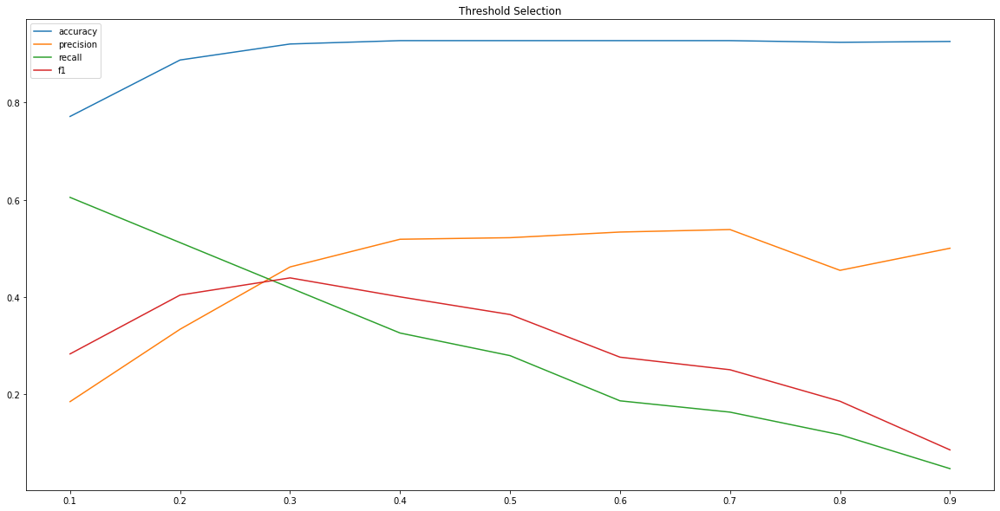

=== Model = gradient_boost ===
Passes naive test? True
Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.97      0.94      1102
           1       0.53      0.29      0.38       134

    accuracy                           0.89      1236
   macro avg       0.72      0.63      0.66      1236
weighted avg       0.88      0.89      0.88      1236

Metrics:
{'cross_val_accuracy': 0.889,
 'recall': 0.291,
 'test_accuracy': 0.895,
 'train_accuracy': 0.957,
 'train_test_accuracy_diff': 0.063}


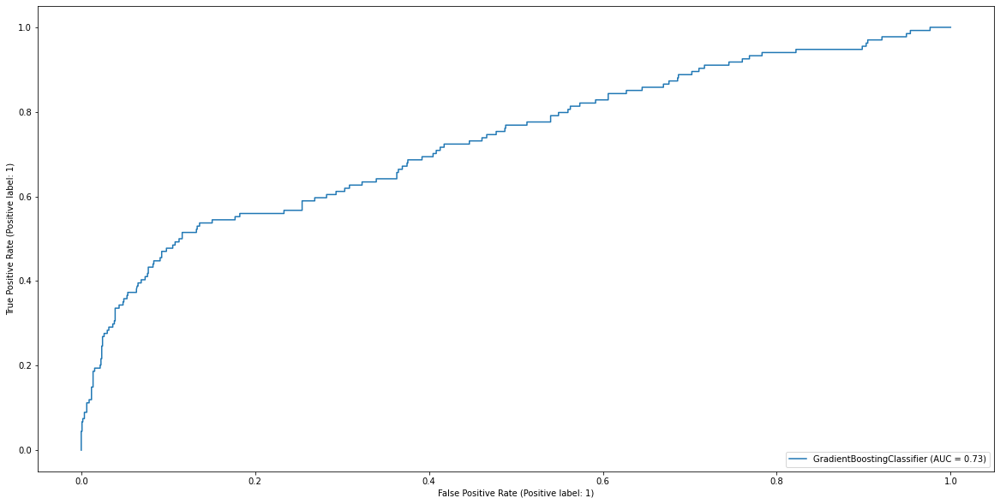

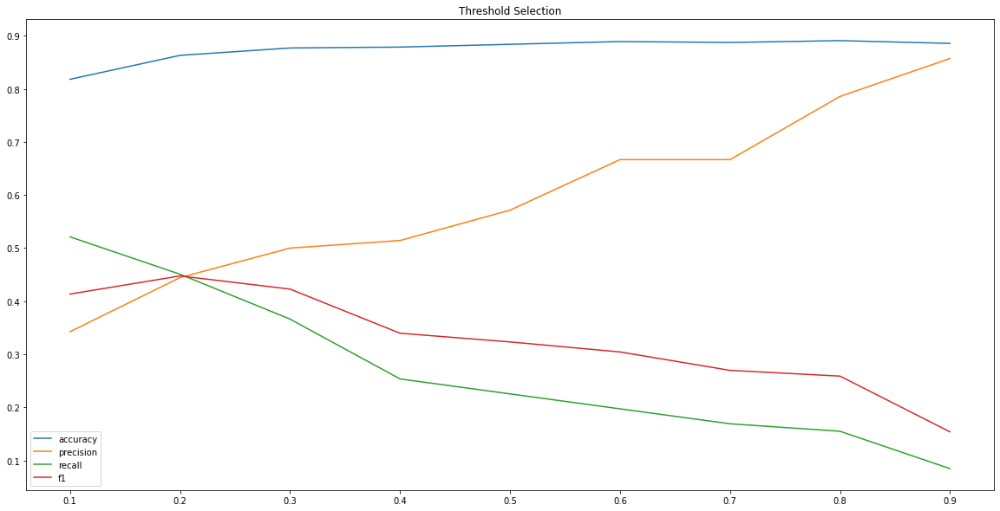

In [9]:
from sklearn.model_selection import KFold, cross_val_score, train_test_split
from sklearn.metrics import plot_roc_curve, classification_report, accuracy_score, precision_score, recall_score, f1_score
from sklearn.neural_network import MLPClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression

from pprint import pprint


classifiers = {
    "log_regr": LogisticRegression(class_weight="balanced"),
    "linear_svc": SVC(class_weight="balanced", kernel="linear", C=0.025),
    "rbf_svc": SVC(class_weight="balanced", gamma=2, C=1),
    "decision_tree": DecisionTreeClassifier(class_weight="balanced", max_depth=5),
    "random_forest": RandomForestClassifier(class_weight="balanced", max_depth=5, n_estimators=100),
    "neural_net": MLPClassifier(max_iter=100),
    "gradient_boost": GradientBoostingClassifier(n_estimators=100, max_depth=5)
}

k_fold = KFold(n_splits=5, shuffle=True, random_state=0)

results = {}
for name, model in classifiers.items():
    metrics = {}
    try:
        print(f"=== Model = {name} ===")
        
        model.fit(X, y)
        preds = model.predict(X_test)
        
        metrics["train_accuracy"] = model.score(X, y)
        
        train_cv = cross_val_score(
            model, X, y, cv=k_fold, scoring="accuracy"
        )
        metrics["cross_val_accuracy"] = np.mean(train_cv)
        metrics["test_accuracy"] = model.score(X_test, y_test)
        metrics["train_test_accuracy_diff"] = metrics["train_accuracy"] - metrics["test_accuracy"]
        metrics["recall"] = recall_score(y_test, preds)
        
        print(f"Passes naive test? {metrics['test_accuracy'] > NAIVE_STAT}")
        
        print("Classification Report:")
        print(classification_report(y_test, preds))
        
        print("Metrics:")
        results[name] = {k: round(v,3) for k,v in metrics.items()}
        pprint(results[name])
        
        plot_roc_curve(model, X_test, y_test)  
        plt.show()
        
        # calculate scores for different thresholds
        scores = {'accuracy':[], 'precision':[], 'recall':[], 'f1':[]}
        XX, XX_test, yy, yy_test = train_test_split(X, y, test_size=0.2)
        predicted_prob = model.fit(XX, yy).predict_proba(XX_test)[:,1]
        thresholds = []
        for threshold in np.arange(0.1, 1, step=0.1):
            predicted = (predicted_prob > threshold)
            thresholds.append(threshold)
            scores["accuracy"].append(accuracy_score(yy_test, predicted))
            scores["precision"].append(precision_score(yy_test, predicted))
            scores["recall"].append(recall_score(yy_test, predicted))
            scores["f1"].append(f1_score(yy_test, predicted))
        
        scores_df = pd.DataFrame(scores).set_index(pd.Index(thresholds))    
        scores_df.plot(title="Threshold Selection")
        plt.show()

    except Exception as e:
        print(f"Process failed - error: {e}")


In [ ]:
# show best fit from above
res_df = pd.DataFrame.from_dict(results, orient="index")
res_df.plot(kind="bar", subplots=True, layout=(1, 5), legend=False)

# Notes:
# Best fit is gradient boost by a small amount (over neural net)
# Its precision is better, and 1's are predicted more accurately so it's preferable
# Other models didn't perform well enough to pass naive test (i.e. if you chose the more frequent category always, how accurate you'd be)
# Setting the threshold to somewhere around 0.1 - 0.2 will result in better recall for either model

In [10]:
# train gradient boost with param tuning
from sklearn.experimental import enable_halving_search_cv
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import HalvingGridSearchCV
import json

model = GradientBoostingClassifier(n_estimators=1000)
params = {
    'learning_rate':[0.01, 0.001],
    'max_depth':[2, 6, 12],
    'min_samples_split':[2, 6, 12],
    'min_samples_leaf':[6, 9, 12],
    'max_features':[7, 9, 11, 15],
    'subsample':[0.8, 0.9, 1]
}
random_search = HalvingGridSearchCV(
    model, 
    params,
    resource="n_samples",
    random_state=0,
    scoring="recall",
    n_jobs=-1,
    cv=3,
    verbose=10
)
random_search.fit(X, y)

print("Best Model parameters:", random_search.best_params_)
print("Best Model mean score:", random_search.best_score_)

best_gb = random_search.best_estimator_

n_iterations: 5
n_required_iterations: 6
n_possible_iterations: 5
min_resources_: 12
max_resources_: 2883
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 648
n_resources: 12
Fitting 3 folds for each of 648 candidates, totalling 1944 fits
----------
iter: 1
n_candidates: 216
n_resources: 36
Fitting 3 folds for each of 216 candidates, totalling 648 fits
----------
iter: 2
n_candidates: 72
n_resources: 108
Fitting 3 folds for each of 72 candidates, totalling 216 fits
----------
iter: 3
n_candidates: 24
n_resources: 324
Fitting 3 folds for each of 24 candidates, totalling 72 fits
----------
iter: 4
n_candidates: 8
n_resources: 972
Fitting 3 folds for each of 8 candidates, totalling 24 fits
Best Model parameters: {'learning_rate': 0.01, 'max_depth': 2, 'max_features': 11, 'min_samples_leaf': 6, 'min_samples_split': 6, 'subsample': 0.9}
Best Model mean score: 0.3431988864926047


In [11]:
# save gb params as json
with open("gradient_boost_params.json", "w") as f:
    json.dump({"params": best_gb.get_params()}, f)

In [12]:
# train neural net with param tuning
from sklearn.experimental import enable_halving_search_cv
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import HalvingGridSearchCV
import json

model = MLPClassifier(
    random_state=0,     
    shuffle=True, 
    solver="adam",
    max_iter=1000,
)

params = {
    "hidden_layer_sizes": [(64, 48, 16), (128,), (32, 32, 32, 32)], 
    "activation": ['relu', 'logistic', 'tanh'], 
    "alpha": [0.1, 0.01, 0.001, 0.0001], 
    "learning_rate_init": [0.1, 0.01, 0.001],
}
random_search = HalvingGridSearchCV(
    model, 
    params,
    resource='n_samples',
    random_state=0,
#     scoring="accuracy",
    scoring="recall",
    n_jobs=-1,
    cv=5,
    verbose=5
)
random_search.fit(X, y)

print("Best Model parameters:", random_search.best_params_)
print("Best Model mean score:", random_search.best_score_)

best_nn = random_search.best_estimator_

n_iterations: 5
n_required_iterations: 5
n_possible_iterations: 5
min_resources_: 35
max_resources_: 2883
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 108
n_resources: 35
Fitting 5 folds for each of 108 candidates, totalling 540 fits
----------
iter: 1
n_candidates: 36
n_resources: 105
Fitting 5 folds for each of 36 candidates, totalling 180 fits
----------
iter: 2
n_candidates: 12
n_resources: 315
Fitting 5 folds for each of 12 candidates, totalling 60 fits
----------
iter: 3
n_candidates: 4
n_resources: 945
Fitting 5 folds for each of 4 candidates, totalling 20 fits
----------
iter: 4
n_candidates: 2
n_resources: 2835
Fitting 5 folds for each of 2 candidates, totalling 10 fits
Best Model parameters: {'activation': 'relu', 'alpha': 0.01, 'hidden_layer_sizes': (64, 48, 16), 'learning_rate_init': 0.1}
Best Model mean score: 0.4059907834101383


In [13]:
# save nn params
with open("neural_net_params.json", "w") as f:
    json.dump({"params": best_nn.get_params()}, f)

GradientBoostingClassifier(learning_rate=0.01, max_depth=2, max_features=11,
                           min_samples_leaf=6, min_samples_split=6,
                           n_estimators=1000, subsample=0.9)
Classification Report:
              precision    recall  f1-score   support

           0       0.91      0.98      0.94      1102
           1       0.56      0.20      0.30       134

    accuracy                           0.90      1236
   macro avg       0.74      0.59      0.62      1236
weighted avg       0.87      0.90      0.87      1236

Metrics:
{'cross_val_accuracy': 0.87,
 'recall': 0.201,
 'test_accuracy': 0.896,
 'train_accuracy': 0.913,
 'train_test_accuracy_diff': 0.016}


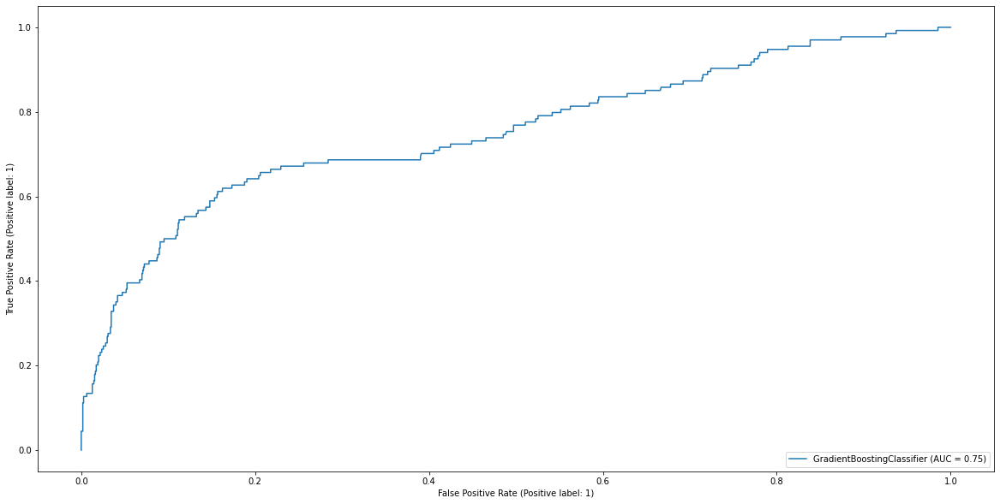

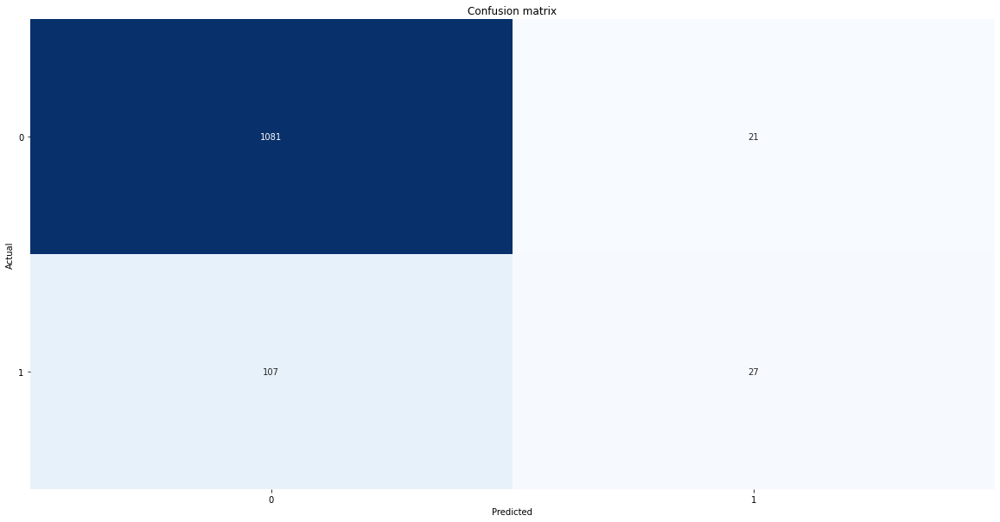

In [14]:
from sklearn.metrics import plot_roc_curve, classification_report, confusion_matrix, recall_score
from sklearn.model_selection import KFold, cross_val_score

k_fold = KFold(n_splits=5, shuffle=True, random_state=0)

# determine best model
scores = {best_nn.score(X_test, y_test): best_nn, best_gb.score(X_test, y_test): best_gb}
best_model = scores[max(scores.keys())]

print("Best model:")
print(best_model)

# show results for optimized boost
metrics = {}
preds = best_model.predict(X_test)

metrics["train_accuracy"] = best_model.score(X, y)

train_cv = cross_val_score(
    model, X, y, cv=k_fold, scoring="accuracy"
)

metrics["cross_val_accuracy"] = np.mean(train_cv)
metrics["test_accuracy"] = best_model.score(X_test, y_test)
metrics["train_test_accuracy_diff"] = metrics["train_accuracy"] - metrics["test_accuracy"]
metrics["recall"] = recall_score(y_test, preds)

print("Classification Report:")
print(classification_report(y_test, preds))

print("Metrics:")
results["cv_boost"] = {k: round(v,3) for k,v in metrics.items()}
pprint(results["cv_boost"])

plot_roc_curve(best_model, X_test, y_test)
plt.show()

# confusion matrix for best model
classes = np.unique(y_test)
fig, ax = plt.subplots()
cm = confusion_matrix(y_test, preds, labels=classes)
sns.heatmap(cm, annot=True, fmt='d', cmap=plt.cm.Blues, cbar=False)
ax.set(xlabel="Predicted", ylabel="Actual", title="Confusion matrix")
ax.set_yticklabels(labels=classes, rotation=0)
plt.show()

# Notes:
# Best model is gradient boost by accuracy and recall


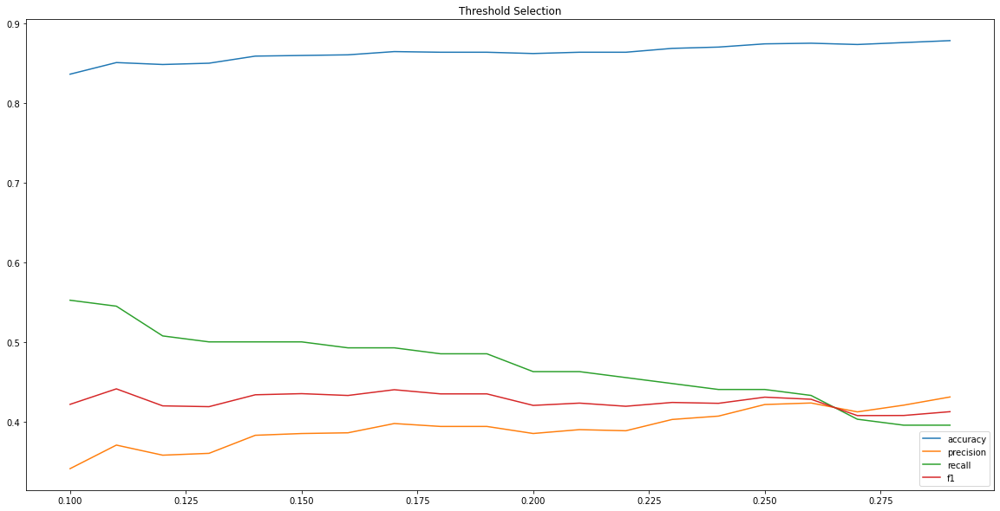

In [15]:
# calculate scores for best model when threshold is between 0.1 and 0.25
scores = {'accuracy':[], 'precision':[], 'recall':[], 'f1':[]}
predicted_prob = best_model.predict_proba(X_test)[:,1]
thresholds = []
for threshold in np.arange(0.1, 0.3, step=0.01):
    predicted = (predicted_prob > threshold)
    thresholds.append(threshold)
    scores["accuracy"].append(accuracy_score(y_test, predicted))
    scores["precision"].append(precision_score(y_test, predicted))
    scores["recall"].append(recall_score(y_test, predicted))
    scores["f1"].append(f1_score(y_test, predicted))
    
scores_df = pd.DataFrame(scores).set_index(pd.Index(thresholds))    
scores_df.plot(title="Threshold Selection")
plt.show()

# Notes:
# Best threshold where accuracy is least affected and recall is highest is around 0.15

In [16]:
# use lime to explore most important classifications features in some examples
from lime.lime_tabular import LimeTabularExplainer

explainer = LimeTabularExplainer(
    training_data=X, 
    feature_names=X.columns.to_list(), 
    class_names=[0, 1], 
    mode="classification", 
    discretize_continuous=False
)
predicted_prob = best_model.predict_proba(X_test)[:,1]
predicted = (predicted_prob > 0.15).astype("int")

test_cases = X_test.join(y_test).reset_index(drop=True)
test_cases["pred"] = predicted
test_cases = test_cases[test_cases.y == 1]

for i, row in test_cases.sample(10).iterrows():
    x, y, yhat = row.drop(["y", "pred"]).values, row["y"], row["pred"]
    explained = explainer.explain_instance(x, best_model.predict_proba, num_features=10)
    print(f"Idx : {i}")
    print(f"Actual = {y}; Predicted = {yhat}")
    explained.show_in_notebook()

# Notes:
# Features helpful for identifying 0's are low euribor3m, low campaign, low nr.employed
# Features best for predicting 1's are age, pdays, university degree, poutcome = sucess

Idx : 474
Actual = 1.0; Predicted = 1.0


Idx : 454
Actual = 1.0; Predicted = 1.0


Idx : 374
Actual = 1.0; Predicted = 0.0


Idx : 733
Actual = 1.0; Predicted = 1.0


Idx : 708
Actual = 1.0; Predicted = 1.0


Idx : 803
Actual = 1.0; Predicted = 0.0


Idx : 360
Actual = 1.0; Predicted = 1.0


Idx : 865
Actual = 1.0; Predicted = 0.0


Idx : 687
Actual = 1.0; Predicted = 1.0


Idx : 1017
Actual = 1.0; Predicted = 1.0
